In [ ]:
!wget "https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-train.txt"
!wget "https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-test.txt"

--2022-10-08 16:39:17--  https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-train.txt
Resolving courses.cs.washington.edu (courses.cs.washington.edu)... 128.208.1.193, 2607:4000:200:10::c1
Connecting to courses.cs.washington.edu (courses.cs.washington.edu)|128.208.1.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 855572 (836K) [text/plain]
Saving to: ‘crime-train.txt’

crime-train.txt     100%[===================>] 835.52K  2.23MB/s    in 0.4s    

2022-10-08 16:39:18 (2.23 MB/s) - ‘crime-train.txt’ saved [855572/855572]

--2022-10-08 16:39:18--  https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-test.txt
Resolving courses.cs.washington.edu (courses.cs.washington.edu)... 128.208.1.193, 2607:4000:200:10::c1
Connecting to courses.cs.washington.edu (courses.cs.washington.edu)|128.208.1.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 214736 (210K) [text/plain]
Saving to: ‘crime-test.txt’



In [ ]:
import pandas as pd
df_train = pd.read_table("https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-train.txt")
df_test = pd.read_table("https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-test.txt")

In [ ]:
df_train.to_csv("crime-train.csv", index=False)
df_train.to_csv("crime-test.csv", index=False)

In [ ]:
df_train.head()

,ViolentCrimesPerPop,population,householdsize,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,...,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn
0,0.67,-0.45,-1.85,-1.06,0.67,0.08,-0.85,-0.34,0.68,-0.24,...,-0.23,-0.02,-0.53,-1.08,-0.13,-0.66,-0.41,-0.56,1.26,-0.39
1,0.43,-0.45,-0.27,-0.22,-0.17,-0.34,-0.58,-0.50,-1.57,-0.29,...,-0.23,-0.33,-0.58,0.03,0.22,-0.46,-0.50,-0.11,-0.62,-0.39
2,0.12,-0.14,1.87,0.55,0.04,0.02,-1.19,-0.03,0.68,1.05,...,-0.23,-0.11,-1.51,1.07,0.07,-0.01,-0.41,0.77,0.52,-0.39
3,0.03,-0.38,0.53,-0.28,-0.79,-0.64,-0.35,-0.34,0.46,0.66,...,-0.23,-0.46,0.54,0.58,-0.08,-0.61,-0.23,-0.70,-0.62,-0.39
4,0.14,-0.30,-1.12,-0.74,-0.10,-0.40,-0.30,-0.19,0.68,0.76,...,-0.23,2.10,-0.92,-0.25,0.52,-0.06,-0.50,1.71,-0.27,-0.39


In [ ]:
df_train.columns

Index(['ViolentCrimesPerPop', 'population', 'householdsize', 'agePct12t21',
       'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban',
       'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec',
       'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap',
       'blackPerCap', 'indianPerCap', 'AsianPerCap', 'HispPerCap',
       'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad',
       'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu',
       'PctEmplProfServ', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce',
       'MalePctNevMarr', 'FemalePctDiv', 'TotalPctDiv', 'PersPerFam',
       'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par',
       'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig',
       'PctImmigRecent', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10',
       'PctRecentImmig', 'PctRecImmig5', 'PctRecImmig8', 'PctRecImmig10',
       'PctSpeakEnglOnly', 'PctNotSpe

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing, svm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import norm
from scipy import stats
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings("ignore")


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1595 entries, 0 to 1594
Data columns (total 96 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ViolentCrimesPerPop    1595 non-null   float64
 1   population             1595 non-null   float64
 2   householdsize          1595 non-null   float64
 3   agePct12t21            1595 non-null   float64
 4   agePct12t29            1595 non-null   float64
 5   agePct16t24            1595 non-null   float64
 6   agePct65up             1595 non-null   float64
 7   numbUrban              1595 non-null   float64
 8   pctUrban               1595 non-null   float64
 9   medIncome              1595 non-null   float64
 10  pctWWage               1595 non-null   float64
 11  pctWFarmSelf           1595 non-null   float64
 12  pctWInvInc             1595 non-null   float64
 13  pctWSocSec             1595 non-null   float64
 14  pctWPubAsst            1595 non-null   float64
 15  pctW

In [ ]:
!pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 4.4 MB/s 


In [ ]:
import sweetviz as sv
sweet_report = sv.analyze(df_train)
sweet_report.show_html('sweet_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



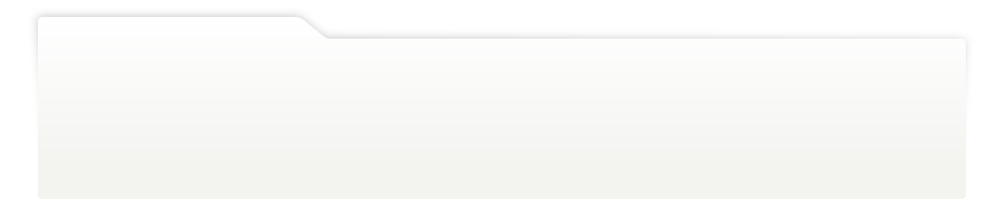
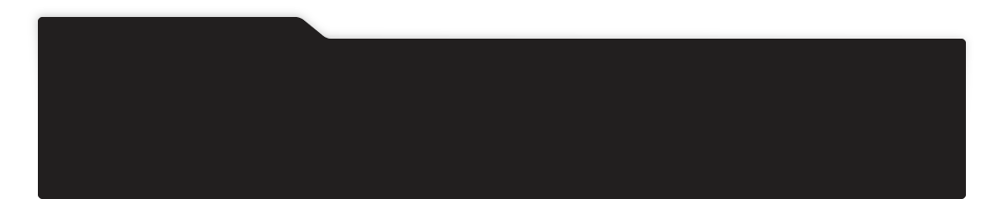
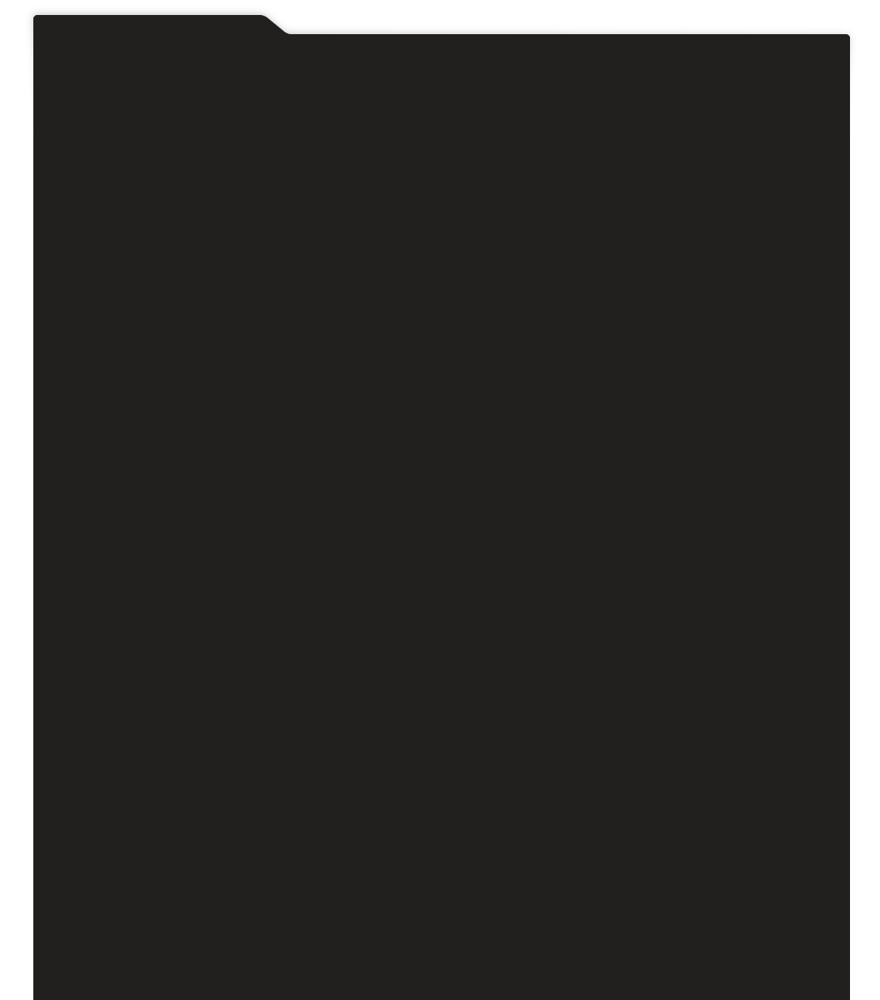
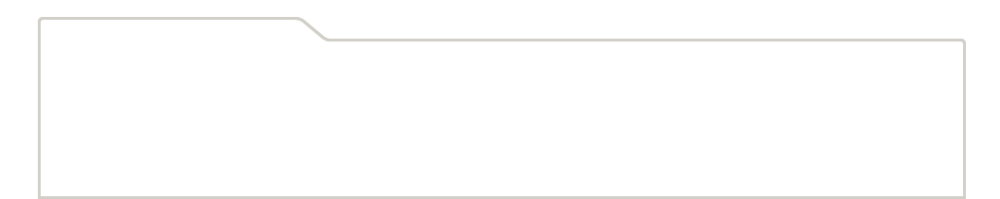
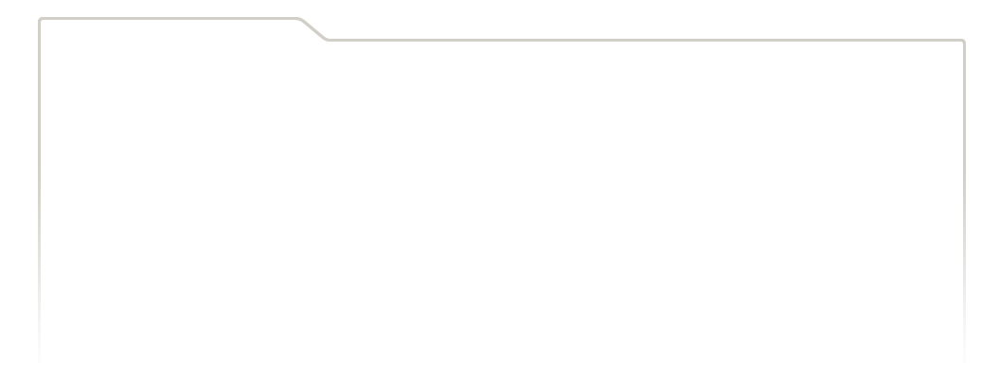
...
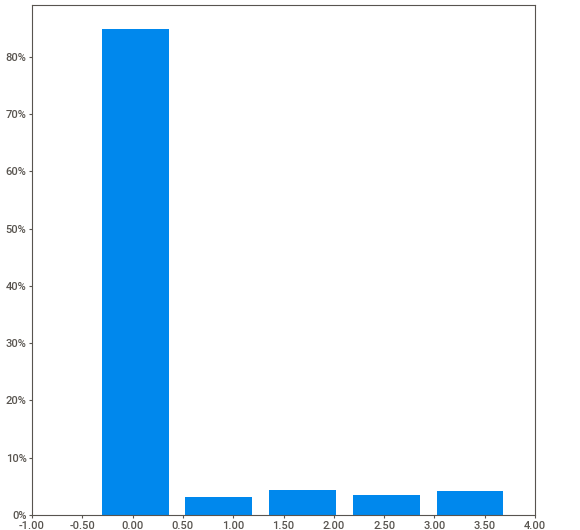
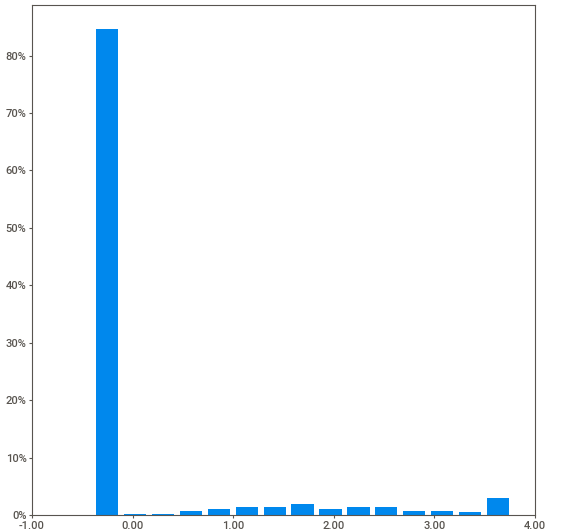
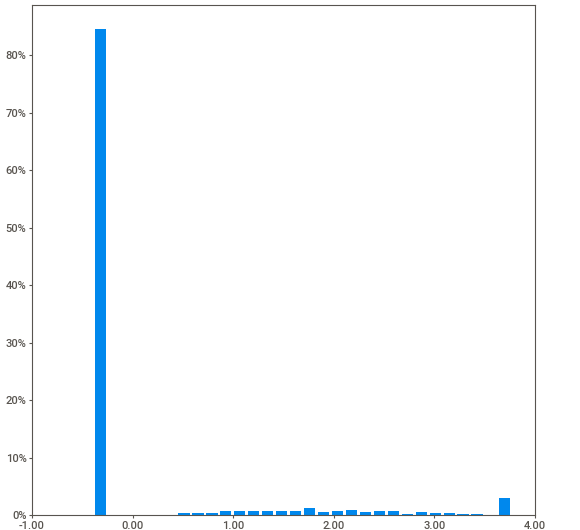
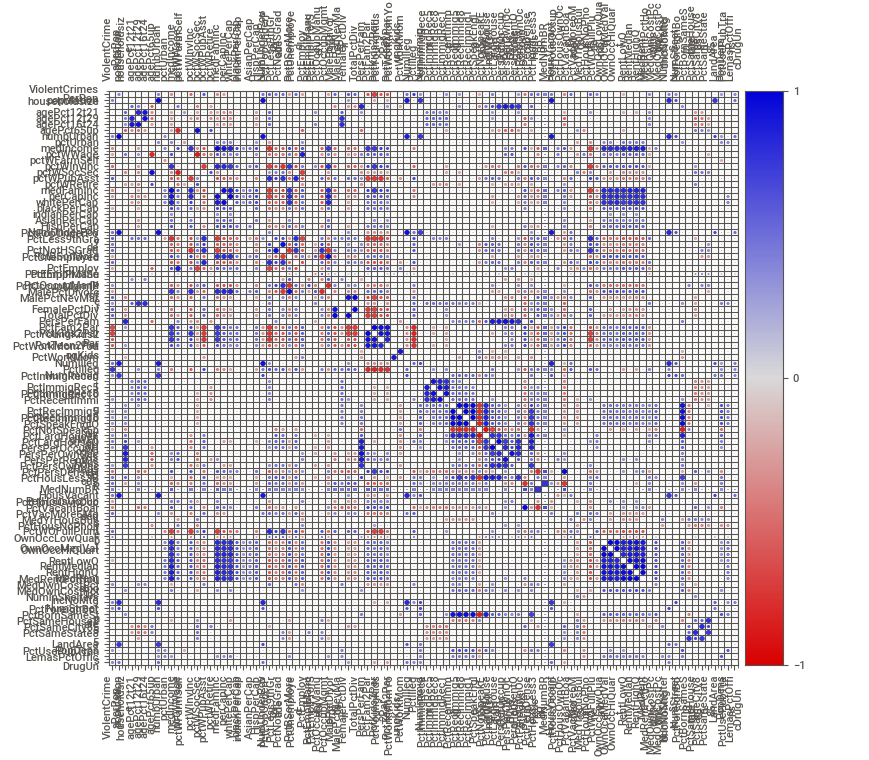
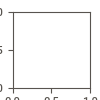

In [ ]:
# show the output
sweet_report.show_notebook()

In [ ]:
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 64 kB 1.9 MB/s 
     |████████████████████████████████| 3.2 MB 10.9 MB/s 
     |████████████████████████████████| 12.9 MB 32.9 MB/s 
     |████████████████████████████████| 1.7 MB 50.7 MB/s 
     |████████████████████████████████| 18.5 MB 423 kB/s 
     |████████████████████████████████| 216 kB 38.2 MB/s 
     |████████████████████████████████| 11.2 MB 37.7 MB/s 
     |████████████████████████████████| 960 kB 65.1 MB/s 
     |████████████████████████████████| 1.6 MB 49.8 MB/s 
     |████████████████████████████████| 120 kB 73.8 MB/s 
     |████████████████████████████████| 82 kB 832 kB/s 
  Created wheel for emoji: filename=emoji-2.1.0-py3-none-any.whl size=212392 sha256=d0fe126e6b91235bd7883dd64a0a2d3d6625e75d6b3cbd6c7c5bbab7365d80e4
  Stored in directory: /root/.cache/pip/wheels/77/75/99/51c2a119f4cfd3af7b49cc57e4f737bed7e40b348a85d82804
Successfu

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [ ]:
df = AV.AutoViz('/content/crime-train.csv')

Shape of your Data Set loaded: (1595, 96)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
pctWPubAsst,101,float64,0,0.000000,6.332288,0,skewed: cap or drop outliers
RentLowQ,100,float64,0,0.000000,6.269592,0,
PctImmigRecent,99,float64,0,0.000000,6.206897,0,
PctEmplManu,99,float64,0,0.000000,6.206897,0,
PctFam2Par,99,float64,0,0.000000,6.206897,0,
PctRecImmig10,99,float64,0,0.000000,6.206897,0,skewed: cap or drop outliers
PctPopUnderPov,99,float64,0,0.000000,6.206897,0,
PctHousLess3BR,99,float64,0,0.000000,6.206897,0,
PctBornSameState,99,float64,0,0.000000,6.206897,0,
PctSameHouse85,99,float64,0,0.000000,6.206897,0,


    96 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
30 numeric variables in data exceeds limit, taking top 30 variables
    List of variables selected: ['ViolentCrimesPerPop', 'population', 'householdsize', 'agePct12t21', 'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban', 'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'HispPerCap', 'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad', 'PctBSorMore', 'PctUnemployed', 'PctEmploy']
   Total columns > 30, too numerous to print.
Number of All Scatter Plots = 465
No categorical or numeric vars in data set. Hence no bar charts.
All Plots done
Time to run AutoViz = 57 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport

df=pd.read_csv("/content/crime-train.csv")

df.head()

,ViolentCrimesPerPop,population,householdsize,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,...,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn
0,0.67,-0.45,-1.85,-1.06,0.67,0.08,-0.85,-0.34,0.68,-0.24,...,-0.23,-0.02,-0.53,-1.08,-0.13,-0.66,-0.41,-0.56,1.26,-0.39
1,0.43,-0.45,-0.27,-0.22,-0.17,-0.34,-0.58,-0.50,-1.57,-0.29,...,-0.23,-0.33,-0.58,0.03,0.22,-0.46,-0.50,-0.11,-0.62,-0.39
2,0.12,-0.14,1.87,0.55,0.04,0.02,-1.19,-0.03,0.68,1.05,...,-0.23,-0.11,-1.51,1.07,0.07,-0.01,-0.41,0.77,0.52,-0.39
3,0.03,-0.38,0.53,-0.28,-0.79,-0.64,-0.35,-0.34,0.46,0.66,...,-0.23,-0.46,0.54,0.58,-0.08,-0.61,-0.23,-0.70,-0.62,-0.39
4,0.14,-0.30,-1.12,-0.74,-0.10,-0.40,-0.30,-0.19,0.68,0.76,...,-0.23,2.10,-0.92,-0.25,0.52,-0.06,-0.50,1.71,-0.27,-0.39


In [ ]:
#design_report = ProfileReport(df)
#design_report.to_file(output_file='report.html')
#design_report

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing, svm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import norm
from scipy import stats
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet

from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.metrics import r2_score

import warnings
warnings.filterwarnings("ignore")

In [ ]:
import pandas as pd
df_train = pd.read_table("https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-train.txt")
df_test = pd.read_table("https://courses.cs.washington.edu/courses/cse446/19sp/assignments/crime-test.txt")

In [ ]:
X_train = df_train.copy()
y_train = X_train.pop('ViolentCrimesPerPop')
X_train = X_train.values

X_test = df_test.copy()
y_test = X_test.pop('ViolentCrimesPerPop')
X_test = X_test.values

In [ ]:
X_train.shape

(1595, 95)

In [ ]:
X_test.shape

(399, 95)

In [ ]:
#Ridge Model

ridge_model = Ridge(alpha = 1.0)
ridge_model.fit(X_train, y_train)             
pred_ridge = ridge_model.predict(X_test)

#Lasso Model
Lasso_model = Lasso(alpha = 0.001, normalize =False)
Lasso_model.fit(X_train, y_train)
pred_Lasso = Lasso_model.predict(X_test) 

#Decision Tree
dtr = DecisionTreeRegressor(max_depth= 5, max_leaf_nodes= 20, min_samples_leaf= 4, min_weight_fraction_leaf= 0.2, splitter='best')
dtr.fit(X_train, y_train) 
pred_test_dtr= dtr.predict(X_test)


#Random Forest
model_rfr = RandomForestRegressor(max_features= 10, n_estimators= 100)
model_rfr .fit(X_train, y_train) 
pred_test_rfr= model_rfr .predict(X_test)

In [ ]:
r2scores = dict()

r2scores['random forest'] = r2_score(y_test, pred_test_rfr)
r2scores['Decision Tree'] = r2_score(y_test, pred_test_dtr)
r2scores['Lasso Model'] = r2_score(y_test, pred_Lasso)
r2scores['Ridge Model'] = r2_score(y_test, pred_ridge)

In [ ]:
r2scores

{'random forest': 0.6428537899860405,
 'Decision Tree': 0.45328213373291537,
 'Lasso Model': 0.6389375499259762,
 'Ridge Model': 0.6373730892400946}

In [ ]:
mse_scores = dict()

mse_scores['random forest'] = mean_squared_error(y_test, pred_test_rfr)
mse_scores['Decision Tree'] = mean_squared_error(y_test, pred_test_dtr)
mse_scores['Lasso Model'] = mean_squared_error(y_test, pred_Lasso)
mse_scores['Ridge Model'] = mean_squared_error(y_test, pred_ridge)

In [ ]:
mse_scores

{'random forest': 0.02095941947368421,
 'Decision Tree': 0.0320845882486098,
 'Lasso Model': 0.021189247246951988,
 'Ridge Model': 0.02128105891076384}

In [ ]:
scaler = StandardScaler()

In [ ]:
X_train = df_train.copy()
y_train = X_train.pop('ViolentCrimesPerPop')
X_train = scaler.fit_transform(X_train)

X_test = df_test.copy()
y_test = X_test.pop('ViolentCrimesPerPop')
X_test = scaler.fit_transform(X_test)

In [ ]:
#Ridge Model

ridge_model = Ridge(alpha = 1.0)
ridge_model.fit(X_train, y_train)             
pred_ridge = ridge_model.predict(X_test)

#Lasso Model
Lasso_model = Lasso(alpha = 0.001, normalize =False)
Lasso_model.fit(X_train, y_train)
pred_Lasso = Lasso_model.predict(X_test) 

#Decision Tree
dtr = DecisionTreeRegressor(max_depth= 5, max_leaf_nodes= 20, min_samples_leaf= 4, min_weight_fraction_leaf= 0.2, splitter='best')
dtr.fit(X_train, y_train) 
pred_test_dtr= dtr.predict(X_test)


#Random Forest
model_rfr = RandomForestRegressor(max_features= 10, n_estimators= 100)
model_rfr .fit(X_train, y_train) 
pred_test_rfr= model_rfr .predict(X_test)

In [ ]:
r2scores = dict()

r2scores['random forest'] = r2_score(y_test, pred_test_rfr)
r2scores['Decision Tree'] = r2_score(y_test, pred_test_dtr)
r2scores['Lasso Model'] = r2_score(y_test, pred_Lasso)
r2scores['Ridge Model'] = r2_score(y_test, pred_ridge)

In [ ]:
r2scores

{'random forest': 0.6484439156381734,
 'Decision Tree': 0.45328213373291526,
 'Lasso Model': 0.6389375499259762,
 'Ridge Model': 0.6373730892400946}

In [ ]:
mse_scores = dict()

mse_scores['random forest'] = mean_squared_error(y_test, pred_test_rfr)
mse_scores['Decision Tree'] = mean_squared_error(y_test, pred_test_dtr)
mse_scores['Lasso Model'] = mean_squared_error(y_test, pred_Lasso)
mse_scores['Ridge Model'] = mean_squared_error(y_test, pred_ridge)

In [ ]:
mse_scores

{'random forest': 0.020631358345864662,
 'Decision Tree': 0.032084588248609804,
 'Lasso Model': 0.021189247246951988,
 'Ridge Model': 0.02128105891076384}